### Import packages

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import datashader as ds
import datashader.transfer_functions as tf
from collections import OrderedDict
import csv
from datashader.utils import lnglat_to_meters as webm
import glob

In [2]:
import math

from datashader.layout import random_layout, circular_layout, forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle

from itertools import chain


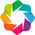

In [3]:
import holoviews as hv
import geoviews as gv
import dask.dataframe as dd

from functools import partial
from bokeh.tile_providers import CARTODBPOSITRON, STAMEN_TONER_BACKGROUND,STAMEN_TERRAIN_RETINA,STAMEN_TONER_LABELS

from datashader.colors import colormap_select, Greys9,viridis
from colorcet import palette

from bokeh.models import WMTSTileSource
from holoviews.operation.datashader import datashade, dynspread
hv.extension('bokeh')

### INRIX Trip data

In [106]:
tr_trips=glob.glob('/local/data/fanj/FH_Project/INRIXData/trips/*csv')

In [112]:
tr_trips

['/local/data/fanj/FH_Project/INRIXData/trips/trips.csv',
 '/local/data/fanj/FH_Project/INRIXData/trips/trips1.csv',
 '/local/data/fanj/FH_Project/INRIXData/trips/trips2.csv']

In [ ]:
trip1_df=pd.read_csv('/local/data/fanj/FH_Project/INRIXData/trips/trips.csv',header=None)
trrip1_df.shape

In [113]:
fp='/local/data/fanj/FH_Project/INRIXData/'
tr_trips_hd='schema/TripBulkReportTripsHeaders.csv'

trip_cols=[]

with open(fp+tr_trips_hd,'r') as tf:
    c_tf=csv.reader(tf)
    trip_cols=next(c_tf)
trip_df=pd.concat([pd.read_csv(tf,header=None) for tf in tr_trips])


In [116]:
trip_df.columns=trip_cols
trip_df.head(2)

,TripId,DeviceId,ProviderId,Mode,StartDate,StartWDay,EndDate,EndWDay,StartLocLat,StartLocLon,...,DestinationZoneName,MultipleZones,MultipleCorridors,EndpointType,TripMeanSpeedKph,TripMaxSpeedKph,TripDistanceMeters,MovementType,OriginCbg,DestCbg
0,00024902327a3c3216829e39ca4ca2ab,7bd17f0f925f1b839e8cfbb2c04b8af4,c3e878e27f52e2a57ace4d9a76fd9acf,1,2018-07-23T15:50:26.500Z,1,2018-07-23T16:18:08.990Z,1,39.174,-76.858,...,bmc_kml_counties_Zone_6,True,NaN,0,50.984583,106.821345,23544.822213,1,NaN,NaN
1,000b5aa04c82ba93dd8c374f052948cd,4882d96300337fe918c19a68e42415ac,54229abfcfa5649e7003b83dd4755294,1,2018-07-21T23:52:44.000Z,6,2018-07-21T23:54:14.000Z,6,39.140,-76.618,...,bmc_kml_counties_Zone_5,False,NaN,2,16.853688,17.983378,421.342206,1,NaN,NaN


In [129]:
### filter trips that only within BMC area
trip_df = trip_df.query(
    'StartLocLat >=38.500479999999996 & StartLocLat <= 39.72293 & StartLocLon >= -77.68160999999999 & StartLocLon <= -76.02194 & EndLocLat >=38.500479999999996 & EndLocLat <= 39.72293 & EndLocLon >= -77.68160999999999 & EndLocLon <= -76.02194 '
)
trip_df.shape
# 38.500479999999996 39.72293
# -77.68160999999999 -76.02194

(5704949, 30)

#### Prepare graph node and edges for graph vis

In [130]:
st_nodes=trip_df.loc[:,['StartLocLat','StartLocLon']]
end_nodes=trip_df.loc[:,['EndLocLat','EndLocLon']]

end_nodes=end_nodes.rename(columns={"EndLocLat":'y',"EndLocLon":'x'})
st_nodes=st_nodes.rename(columns={"StartLocLat":'y',"StartLocLon":'x'})

july_nodes=st_nodes.append(end_nodes,ignore_index=True)
july_nodes.head(3)

,y,x
0,39.174,-76.858
1,39.140,-76.618
2,39.159,-77.222


In [131]:
july_nodes.reset_index(inplace=True)
july_nodes.head(2)

,index,y,x
0,0,39.174,-76.858
1,1,39.140,-76.618


In [132]:
LEN=end_nodes.shape[0]
july_edges=pd.DataFrame([(i,i+LEN) for i in range(LEN)], columns=['source','target'])
print(july_edges.shape)

(5704949, 2)


#### Visualization trip graph with no basemap

Random layout

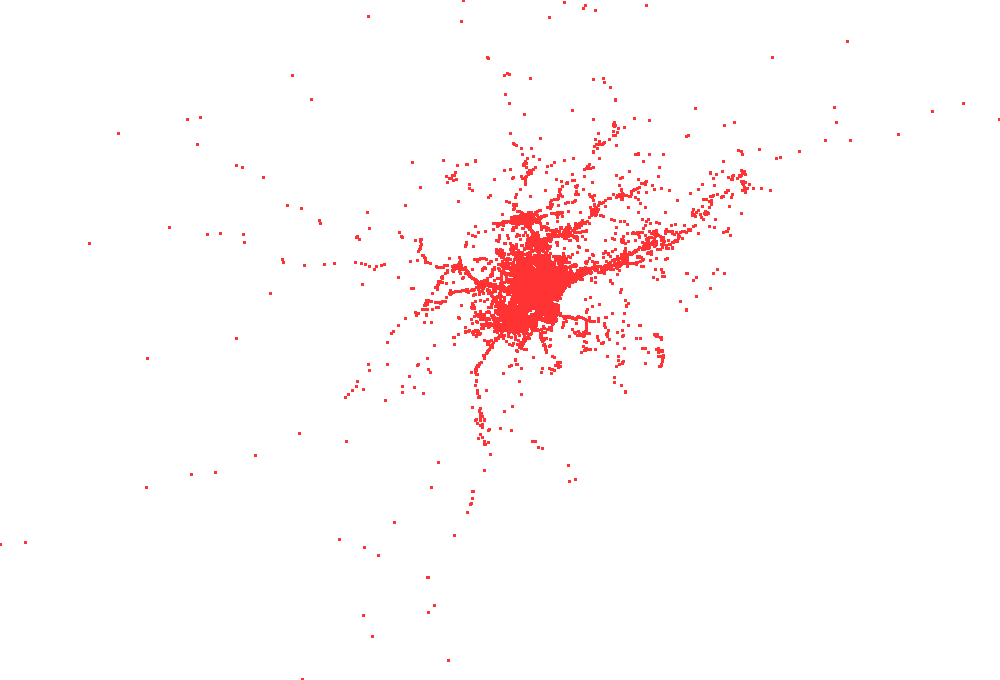

In [15]:
cvsopts = dict(plot_height=680, plot_width=1000)

def nodesplot(nodes, name=None, canvas=None, cat=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    aggregator=None if cat is None else ds.count_cat(cat)
    agg=canvas.points(nodes,'x','y',aggregator)
    return tf.spread(tf.shade(agg, cmap=["#FF3333"]), px=1, name=name)

def edgesplot(edges, name=None, canvas=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    return tf.shade(canvas.line(edges, 'x','y', agg=ds.count()), name=name)
    
def graphplot(nodes, edges, name="", canvas=None, cat=None):
    if canvas is None:
        xr = nodes.x.min(), nodes.x.max()
        yr = nodes.y.min(), nodes.y.max()
        canvas = ds.Canvas(**cvsopts, x_range=xr, y_range=yr)
        
    np = nodesplot(nodes, name + " nodes", canvas, cat)
    ep = edgesplot(edges, name + " edges", canvas)
    return tf.stack(ep, np, how="over", name=name)

tf.Images(nodesplot(july_nodes,"Random layout"))

""

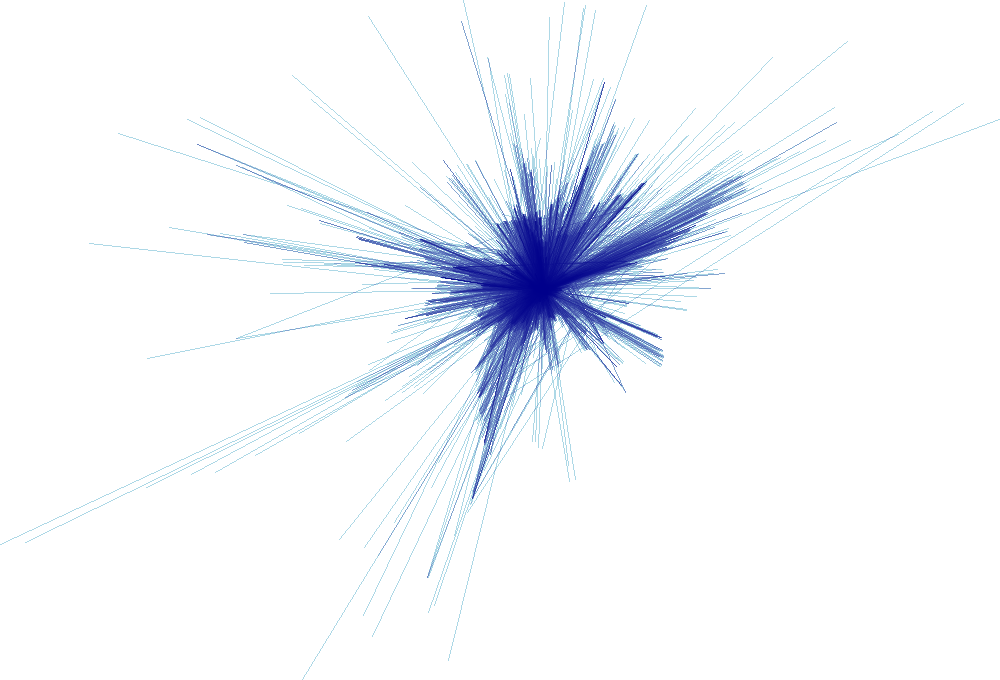

In [16]:
newEdges=connect_edges(july_nodes,july_edges,initial_bandwidth=0.3,decay=0.25)
tf.Images(edgesplot(newEdges))

#### Visualization trip graph with basemap

Loading BokehJS ...


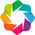

In [21]:
import geoviews as gv
from holoviews.operation.datashader import datashade,dynspread, directly_connect_edges,bundle_graph
import holoviews as hv
from bokeh.plotting import figure,output_notebook,show
from shapely.geometry import Point
output_notebook()
hv.extension('bokeh')

from bokeh.tile_providers import STAMEN_TONER,STAMEN_TONER_BACKGROUND,STAMEN_TERRAIN
from datashader.bokeh_ext import InteractiveImage

plot_width  = 1000
plot_height = 680

minx, miny, maxx, maxy = -79.4877,37.8866,-74.9863,39.723
y_range = miny, maxy
x_range = minx, maxx

def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p
    
options = dict(line_color=None, fill_color='blue', size=4)

In [19]:
from bokeh.sampledata.us_states import data as us_states
from bokeh.sampledata.airport_routes import airports, routes
from colorcet import palette
from bokeh.models import WMTSTileSource
from bokeh.tile_providers import CARTODBPOSITRON, STAMEN_TONER_BACKGROUND,STAMEN_TERRAIN_RETINA,STAMEN_TONER_LABELS
import cartopy
from cartopy import crs as ccrs

# Count the number of connections from each airport
counts = routes.groupby('SourceID')[['Stops']].count().reset_index().rename(columns={'Stops': 'Connections'})
airports_df = pd.merge(airports, counts, left_on='AirportID', right_on='SourceID', how='left')

# Select only US mainland airports
airport_points = gv.Points(airports_df, kdims=['Longitude', 'Latitude'])\
    .select(Latitude=(20, 70), Longitude=(-175, -50))
routes = routes[routes.SourceID.isin(airport_points.data.AirportID) &
                routes.DestinationID.isin(airport_points.data.AirportID)]

# Convert from Latitudes/Longitudes to Mercator 
airport_points = gv.operation.project_points(airport_points)

# Declare nodes, graph and tiles
nodes = hv.Nodes(airport_points.data, kdims=['Longitude', 'Latitude', 'AirportID'],
                 vdims=['Name', 'City', 'Connections'])
graph = hv.Graph((routes, nodes), kdims=['SourceID', 'DestinationID'], 
                 vdims=['Source', 'Destination'])


In [125]:
%%opts Overlay [width=900 height=720 xaxis=None yaxis=None]
# %%opts Graph [width=800 height=800]
# %%opts RGB (level='glyph' edge_selection_line_color='black' edge_hover_line_color='red')
# %%opts Graph (node_size=8 edge_line_alpha=0 edge_hover_line_alpha=1 edge_selection_line_alpha=1 edge_nonselection_line_alpha=0)

tiles_provider = {'OpenMap': WMTSTileSource(url='http://c.tile.openstreetmap.org/{Z}/{X}/{Y}.png'),
         'ESRI': WMTSTileSource(url='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.jpg'),
         'Wikipedia': WMTSTileSource(url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'),
         'Stamen Toner': STAMEN_TERRAIN_RETINA}


tiles = gv.WMTS(tiles_provider['Stamen Toner'])
# Select 50 busiest airports
# busiest = list(routes.groupby('SourceID').count().sort_values('Stops').iloc[-50:].index.values)
# busiest_airports = bundle_graph(graph.select(AirportID=busiest, selection_mode='nodes'))


# tiles * datashade(bundle_graph(graph), cmap=palette.bgy, width=800, height=800) 

# hv.NdLayout({name: gv.WMTS(wmts, extents=(0, -90, 360, 90), crs=ccrs.PlateCarree())
#             for name, wmts in tiles_provider.items()}, kdims=['Source']).cols(1)

In [62]:
def testbgraph():
    
    from IPython.core.debugger import Tracer; Tracer()()

    tg=bundle_graph(graph)
    datashade(tg,cmap=palette.bgy, width=800, height=800)


In [87]:
testbgraph()

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `Tracer` is deprecated since version 5.1, directly use `IPython.core.debugger.Pdb.set_trace()`
  This is separate from the ipykernel package so we can avoid doing imports until


> <ipython-input-62-c5f445effa37>(5)testbgraph()
      3     from IPython.core.debugger import Tracer; Tracer()()
      4 
----> 5     tg=bundle_graph(graph)
      6     datashade(tg,cmap=palette.bgy, width=800, height=800)
      7 # testbgraph()

ipdb> s
--Call--
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/param/parameterized.py(1884)__new__()
   1882         return inst
   1883 
-> 1884     def __new__(class_,*args,**params):
   1885         # Create and __call__() an instance of this class.
   1886         inst = class_.instance()

ipdb> n
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/param/parameterized.py(1886)__new__()
   1884     def __new__(class_,*args,**params):
   1885         # Create and __call__() an instance of this class.
-> 1886         inst = class_.instance()
   1887         inst._set_name(class_.__name__)
   1888         return inst.__call__(*args,**params)

ipdb> n
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/param/parameterized.py(

ipdb> n
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/core/operation.py(135)__call__()
    133                          for pos, cell in element.items())
    134             processed = element.clone(grid_data)
--> 135         elif dynamic:
    136             from ..util import Dynamic
    137             processed = Dynamic(element, streams=self.p.streams,

ipdb> n
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/core/operation.py(140)__call__()
    138                                 link_inputs=self.p.link_inputs,
    139                                 operation=self, kwargs=params)
--> 140         elif isinstance(element, ViewableElement):
    141             processed = self._process(element)
    142         elif isinstance(element, DynamicMap):

ipdb> n
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/core/operation.py(141)__call__()
    139                                 operation=self, kwargs=params)
    140         elif 

ipdb> n
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py(793)_process()
    791         rename_edges = {d.name: v for d, v in zip(element.kdims[:2], ['source', 'target'])}
    792         rename_nodes = {d.name: v for d, v in zip(element.nodes.kdims[:2], ['x', 'y'])}
--> 793         position_df = element.nodes.redim(**rename_nodes).dframe([0, 1, 2]).set_index(index)
    794         edges_df = element.redim(**rename_edges).dframe([0, 1])
    795         paths = self._bundle(position_df, edges_df)

ipdb> n
> /home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py(794)_process()
    792         rename_nodes = {d.name: v for d, v in zip(element.nodes.kdims[:2], ['x', 'y'])}
    793         position_df = element.nodes.redim(**rename_nodes).dframe([0, 1, 2]).set_index(index)
--> 794         edges_df = element.redim(**rename_edges).dframe([0, 1])
    795         paths = self._bundle(position_df, edges_df)
    796        

ipdb> paths.columns()
*** TypeError: 'Index' object is not callable
ipdb> paths.columns
Index(['Longitude', 'Latitude'], dtype='object')
ipdb> type(paths)
<class 'pandas.core.frame.DataFrame'>
ipdb> paths.shape
(313336, 2)
ipdb> paths.columns
Index(['Longitude', 'Latitude'], dtype='object')
--KeyboardInterrupt--
ipdb> q
Exiting Debugger.


In [89]:
tg._edgepaths.columns

<bound method Dataset.columns of :EdgePaths   [Longitude,Latitude]>

In [76]:
tg2=graph.clone((graph.data,graph.nodes,graph._edgepaths))

In [86]:
tg2._edgepaths.dframe().shape


AttributeError: 'NoneType' object has no attribute 'dframe'

In [38]:
graph.edgepaths()

:EdgePaths   [Longitude,Latitude]

In [54]:
tg._

140489455974832

In [51]:
graph.edgepaths.shape

(31295, 2)

In [133]:
july_nodes.columns = ['index', 'Latitude', 'Longitude']
july_nodes.loc[:,'x'], july_nodes.loc[:,'y'] = webm(july_nodes.Longitude,july_nodes.Latitude)
july_nodes.head()
# july_edges.head()
# graph = hv.Graph((july_edges, july_nodes), kdims=['source', 'target'])

nodes = hv.Nodes(july_nodes, kdims=['x', 'y','index'])
graph = hv.Graph((july_edges, nodes), kdims=['source', 'target'])

In [101]:
%%opts WMTS [width=800 height=600]

tiles*datashade(bundle_graph(graph), cmap=palette.bgy, width=800, height=800) 

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

In [134]:
visgraph=directly_connect_edges(graph)

In [135]:
%%opts WMTS [width=900 height=720]

tiles*datashade(visgraph, cmap=palette.bgy, width=800, height=800) 

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

### INRIX waypoints data

In [2]:
pqfile_list=glob.glob('/local/data/fanj/FH_Project/INRIXData/inrix_waypoints.snappy.parquet/*parquet')

inrix_wp_pd=pd.concat([pd.read_parquet(i) for i in pqfile_list])
print(inrix_wp_pd.shape)
inrix_wp_pd.head(2)

(287334732, 12)


,TripId,WaypointSeq,CaptureDate,Latitude,Longitude,SegmentId,ZoneName,Frc,DeviceId,RawSpeed,RawSpeedMetric,unixtime
0,77ed30a66857f26d819e94701c62e86e,554,2018-07-26T18:18:57.000Z,39.025650,-76.436996,None,None,None,acebfdddddbf12c6b078f13aac9492e8,100.0,kph,1532643537
1,77ed30a66857f26d819e94701c62e86e,555,2018-07-26T18:19:02.000Z,39.025982,-76.438591,None,None,None,acebfdddddbf12c6b078f13aac9492e8,104.0,kph,1532643542


In [3]:
df=inrix_wp_pd
df.loc[:,'x'],df.loc[:,'y']=webm(df.Longitude,df.Latitude)

In [20]:
%%opts Graph [width=900 height=700]

%%opts Overlay [width=900 height=628 xaxis='bottom' yaxis='left']
background='black'
cm = partial(colormap_select, reverse=(background!="black"))

url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'
# url="http://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.png"
# url='https://{s}.tile.openstreetmap.de/tiles/osmde/{z}/{x}/{y}.png'
geomap = gv.WMTS(WMTSTileSource(url=url))
# geomap = gv.WMTS(STAMEN_TERRAIN_RETINA)
points = hv.Points(gv.Dataset(df, kdims=['x', 'y']))
race = dynspread(datashade(points, cmap=palette.bgy, element_type=gv.Image,))
geomap * race

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

### Cellphone data

In [23]:
del inrix_wp_pd
del df

In [24]:
cell_dis_time_fp="/local/data/fanj/FH_Project/CGIS/Micro-Level Data/Airsage/cellphone_distance_time_merge.csv"
cellphone_dis_time_pd=pd.read_csv(cell_dis_time_fp)

print(cellphone_dis_time_pd.shape)
cellphone_dis_time_pd.columns=['EMIN','EpochTime','PointDuration','Latitude','Longitude','TimeInterval','Distance']
cellphone_dis_time_pd.head(1)

(87831658, 7)


,EMIN,EpochTime,PointDuration,Latitude,Longitude,TimeInterval,Distance
0,000a32e41f9118e8d7fdcd70c907c62cd38bbde355fb15...,1498912992,639,39.57745,-76.34885,0,0.0


In [27]:
df=cellphone_dis_time_pd
df.loc[:,'x'],df.loc[:,'y']=webm(df.Longitude,df.Latitude)

In [28]:
%%opts Graph [width=900 height=700]

%%opts Overlay [width=900 height=628 xaxis='bottom' yaxis='left']
background='black'
cm = partial(colormap_select, reverse=(background!="black"))

url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'
# url="http://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.png"
# url='https://{s}.tile.openstreetmap.de/tiles/osmde/{z}/{x}/{y}.png'
geomap = gv.WMTS(WMTSTileSource(url=url))
# geomap = gv.WMTS(STAMEN_TERRAIN_RETINA)
points = hv.Points(gv.Dataset(df, kdims=['x', 'y']))
cellphone_shade = dynspread(datashade(points, cmap=palette.bgy, element_type=gv.Image,))
geomap * cellphone_shade

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

### GPS Micro Data

In [29]:
del cellphone_dis_time_pd
del df

In [30]:
from fastparquet import ParquetFile
gps_pq_file=ParquetFile('/local/data/fanj/FH_Project/CGIS/Micro-Level Data/Airsage/GPS/airsage_gps.snappy.parquet')

gps_pq_file.info

In [33]:
gps_pd=pd.read_parquet('/local/data/fanj/FH_Project/CGIS/Micro-Level Data/Airsage/GPS/airsage_gps.snappy.parquet')
print(gps_pd.shape)
gps_pd.head(2)

(94829401, 7)


,device_id,time,lat,lng,x,y,unixtime
index,,,,,,,
0,2.661404e+15,2017-07-01 20:29:08,38.641337,-77.300806,-8.605086e+06,4.670426e+06,1498940948
1,6.342751e+15,2017-07-01 22:40:02,39.284564,-76.599780,-8.527049e+06,4.762515e+06,1498948802


In [34]:
df=gps_pd

In [35]:
%%opts Graph [width=900 height=700]

%%opts Overlay [width=900 height=628 xaxis='bottom' yaxis='left']
background='black'
cm = partial(colormap_select, reverse=(background!="black"))

url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'
# url="http://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.png"
# url='https://{s}.tile.openstreetmap.de/tiles/osmde/{z}/{x}/{y}.png'
geomap = gv.WMTS(WMTSTileSource(url=url))
# geomap = gv.WMTS(STAMEN_TERRAIN_RETINA)
points = hv.Points(gv.Dataset(df, kdims=['x', 'y']))
gps_shade = dynspread(datashade(points, cmap=palette.bgy, element_type=gv.Image,))
geomap * gps_shade

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

### Cuebiq Data

In [37]:
del gps_pd
del df

In [41]:
# from fastparquet import ParquetFile
# cuebiq_pq_file=ParquetFile('/local/data/fanj/FH_Project/CuebiqData/cuebiq_data_cleaned.snappy.parquet')
# cuebiq_pq_file.info

In [4]:
pqfile_list = glob.glob(
    '/local/data/fanj/FH_Project/CuebiqData/cuebiq_data_projected.snappy.parquet/*parquet'
)
len(pqfile_list)


434

In [5]:

cuebiq_pd = pd.concat([pd.read_parquet(i,columns=['x','y']) for i in pqfile_list])

print(cuebiq_pd.shape)
cuebiq_pd.head(2)

(1199099281, 2)


,x,y
0,-8628906.0,4788125.0
1,-8516055.0,4719659.5


In [6]:
# df=cuebiq_pd


In [8]:
%%opts Graph [width=900 height=700]

%%opts Overlay [width=900 height=628 xaxis='bottom' yaxis='left']
background='black'
cm = partial(colormap_select, reverse=(background!="black"))

url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'
# url="http://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.png"
# url='https://{s}.tile.openstreetmap.de/tiles/osmde/{z}/{x}/{y}.png'
geomap = gv.WMTS(WMTSTileSource(url=url))
# geomap = gv.WMTS(STAMEN_TERRAIN_RETINA)
points = hv.Points(gv.Dataset(cuebiq_pd, kdims=['x', 'y']))
cuebiq_shade = dynspread(datashade(points, cmap=palette.bgy, element_type=gv.Image,))
geomap * cuebiq_shade

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

#### Filter dupont circle points


In [13]:
### Dupont circle bound
# xmin,ymin=webm(-77.050724,38.905161)
# xmax,ymax=webm(-77.034502,38.917049)

### Refined Dupont circle bound
xmin,ymin=webm(-77.0449614623,38.9072510448)
xmax,ymax=webm(-77.0416677096,38.9111247779)

In [14]:
df=cuebiq_pd.query('x> @xmin & x<@xmax & y>@ymin & y<@ymax')

In [15]:
%%opts Graph [width=900 height=700]

%%opts Overlay [width=900 height=628 xaxis='bottom' yaxis='left']
background='black'
cm = partial(colormap_select, reverse=(background!="black"))

url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'
# url="http://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.png"
# url='https://{s}.tile.openstreetmap.de/tiles/osmde/{z}/{x}/{y}.png'
geomap = gv.WMTS(WMTSTileSource(url=url))
# geomap = gv.WMTS(STAMEN_TERRAIN_RETINA)
points = hv.Points(gv.Dataset(df, kdims=['x', 'y']))
dp_shade = dynspread(datashade(points, cmap=palette.rainbow, element_type=gv.Image,))
geomap * dp_shade

/home/fanj/.conda/envs/ds/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

In [ ]:
temp_pd.loc[:,'date']=pd.to_datetime(temp_pd.date)


temp_pd.loc[:,'etimestamp']=temp_pd['InitialEpochTime']+temp_pd['travel_time']
temp_pd.loc[:,'edate']=pd.to_datetime(temp_pd.etimestamp,unit='s').dt.tz_localize('utc').dt.tz_convert('US/Eastern')

temp_pd['s_hour']=temp_pd.date.dt.hour

temp_pd.loc[:,'e_hour']=temp_pd.edate.dt.hour

temp_pd['dow']=temp_pd.date.dt.dayofweek

temp_pd.head(2)